In [ ]:
pip install pandas
pip install seaborn
pip install matplotlib

In [ ]:
import pandas as pd

In [25]:
# read teh CSV file
df = pd.read_csv('E:\Projekte\Kindeswohl.csv')

# print the first 5 rows of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column                                                                                             Non-Null Count  Dtype  
---  ------                                                                                             --------------  -----  
 0   Alter des Kindes (0-17 Jahre)                                                                      1000 non-null   int64  
 1   Geschlecht des Kindes (1=männlich, 2=weiblich)                                                     1000 non-null   int64  
 2   Bildungsniveau der Eltern (0=kein Abschluss, 1=Hauptschule, 2=Realschule, 3=Abitur, 4=Hochschule)  1000 non-null   int64  
 3   Einkommensstatus der Familie (0=unter der Armutsgrenze, 1=mittleres Einkommen, 2=hohes Einkommen)  1000 non-null   int64  
 4   Arbeitslosigkeit der Eltern                                                                        1000 non-null   object

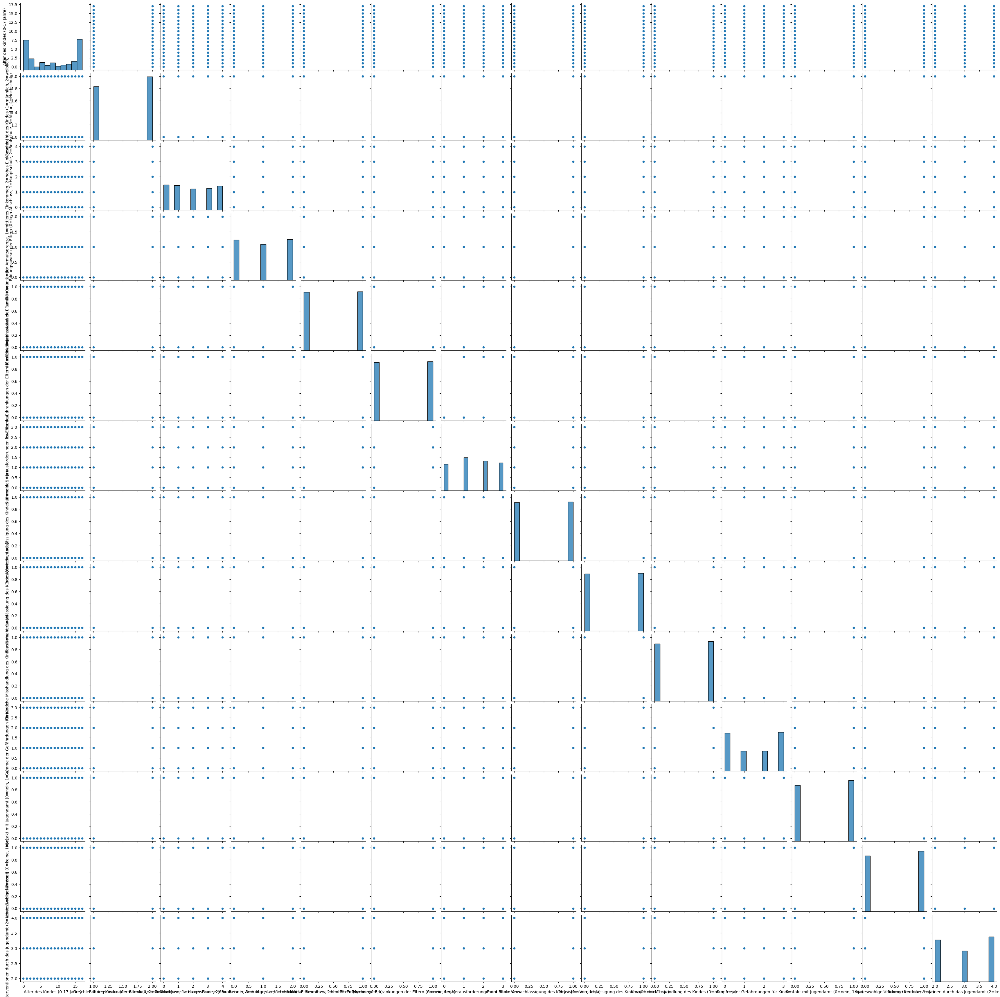

In [28]:
# erstele ein paarplot um die zusammenhänge zwischen den Variablen zu visualisieren
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df)
# show the plot
plt.show()



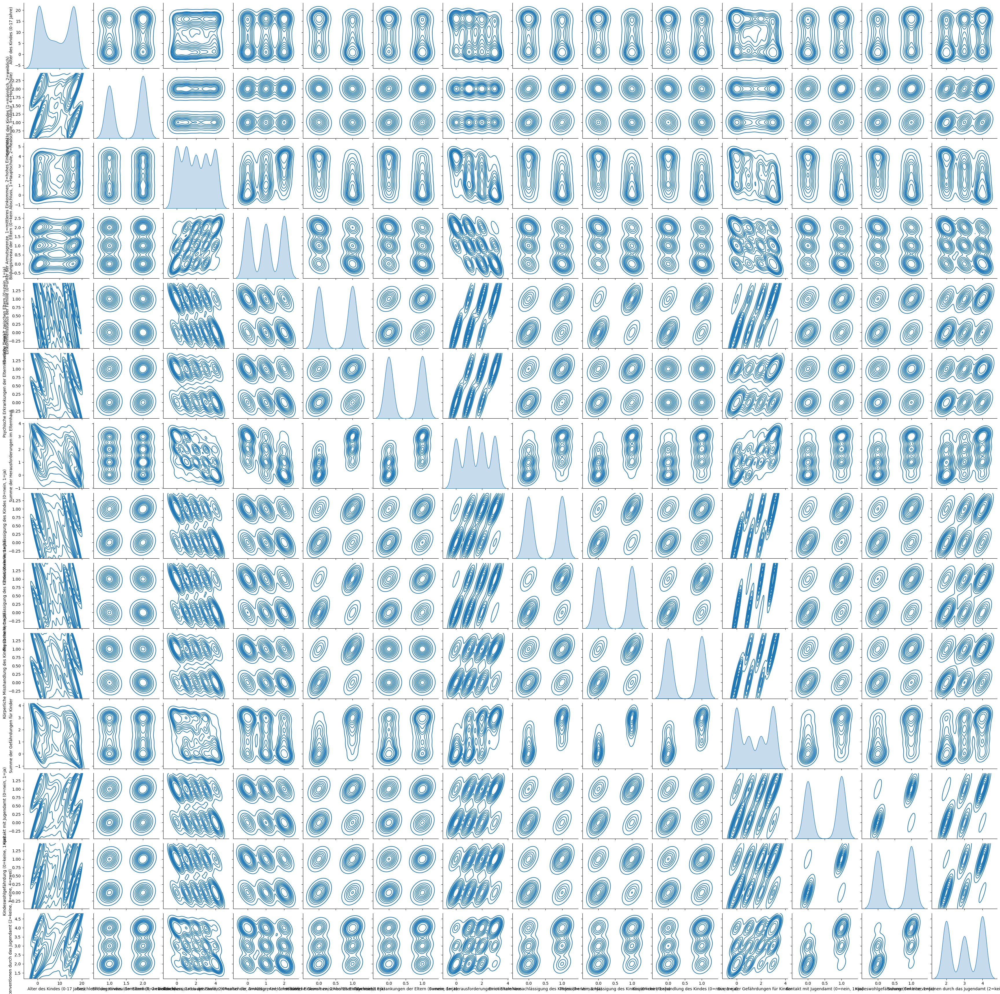

In [ ]:
# Generire eine paarplot mit kde    
sns.pairplot(df, kind='kde')
# show the plot
plt.show()

In [ ]:
# erstelle ein korrelationsmatrix zwiscehn den Variablen (nur numerische Variablen)
correlation_matrix = df.corr(numeric_only=True)
print(correlation_matrix)
# Visualisiere die Korrelationsmatrix mit einem Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
# show the plot
plt.show()


In [ ]:
# Filter: Nur bestätigte Kindeswohlgefährdung
gefaehrdet = df[df["Kindeswohlgefährdung (0=keine, 1=ja)"] == 1]


# Sortiere nach der Summe der Gefährdungen (absteigend)
gefaehrdet = gefaehrdet.sort_values("Summe der Gefährdungen für Kinder", ascending=False)
# Filter: Nur bestätigte Kindeswohlgefährdung und keine Inobhutnahme
gefaehrdet_ohne_inobhut = gefaehrdet[gefaehrdet["Inobhutnahme durch Jugendamt"] == "keine"]
gefaehrdet_ohne_inobhut = gefaehrdet_ohne_inobhut[gefaehrdet_ohne_inobhut["Beratung durch Jugendamt"] == "keine"]
# Sortiere nach der Summe der Gefährdungen (absteigend)
gefaehrdet_ohne_inobhut = gefaehrdet_ohne_inobhut.sort_values("Summe der Gefährdungen für Kinder", ascending=False)

# Zeige die 10 gefährdetsten Kinder ohne Inobhutnahme
# Zeige die 10 gefährdetsten Kinder ohne Inobhutnahme
print("Anzahl der Zeilen:", len(gefaehrdet_ohne_inobhut))
gefaehrdet_ohne_inobhut.head(10)
